In [1]:
# Install ultralytics
!pip -q install  ultralytics

In [2]:
# # Install all required packages
# %pip install pandas pathlib scikit-learn tqdm opencv-python pyyaml matplotlib ultralytics numpy pillow ipywidgets

# # Enable the Jupyter widget extension (needed for tqdm.notebook)
# %jupyter nbextension enable --py widgetsnbextension

# Import libraries
import pandas as pd
import os
from pathlib import Path
import shutil
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.notebook import tqdm
import cv2
import yaml
import matplotlib.pyplot as plt
from ultralytics import YOLO
import multiprocessing
import numpy as np
from PIL import Image

# Verify imports completed successfully
print("All packages imported successfully!")

All packages imported successfully!


In [3]:
# INPUT_DIRS
INPUT_DATA_DIR = Path('.')

In [4]:
os.listdir(INPUT_DATA_DIR)

['.DS_Store',
 'SampleSubmission.csv',
 'Cocoa_Disease_Starter_Notebook.ipynb',
 'yolov8n.pt',
 'dataset',
 'Test.csv',
 'submission_varied_20250424_130356.csv',
 '.gitignore',
 'data.yaml',
 'scripts',
 'Original.ipynb',
 'Train.csv',
 'dataset.zip',
 'Starter.ipynb',
 '.git',
 '.vscode',
 'runs']

In [5]:
## Drop the Folder if it already exists
DATASETS_DIR = Path('dataset')
DATASETS_DIR

PosixPath('dataset')

In [6]:
# Image & labels directory
TRAIN_IMAGES_DIR = DATASETS_DIR / 'images' / 'train'
TRAIN_LABELS_DIR = DATASETS_DIR / 'labels'/ 'train'
TEST_IMAGES_DIR = DATASETS_DIR / 'images' / 'test'
VAL_IMAGES_DIR = DATASETS_DIR / 'images' /'val'
VAL_LABELS_DIR = DATASETS_DIR / 'labels' /'val'

In [7]:
# Check if DATASETS_DIR exists, if it does delete it and recreate it
for DIR in [TRAIN_IMAGES_DIR, VAL_IMAGES_DIR, TEST_IMAGES_DIR, VAL_LABELS_DIR, DATASETS_DIR]:
  if DIR.exists():
    shutil.rmtree(DIR)
  DIR.mkdir(parents=True, exist_ok = True)

In [8]:
# Unpack the 'dataset.zip'
shutil.unpack_archive(INPUT_DATA_DIR / 'dataset.zip', DATASETS_DIR)

In [9]:
def count_files(directory):
    total_files = 0
    for root, _, files in os.walk(directory):
        total_files += len(files)
    return total_files


In [10]:
## Count the number files in TRAIN_IMAGES_DIR
num_train_images = count_files(TRAIN_IMAGES_DIR)
print(f"There are {num_train_images} in {TRAIN_IMAGES_DIR}")

There are 5529 in dataset/images/train


In [11]:
## Count the number of files in TRAIN_LABELS_DIR
num_train_labels = count_files(TRAIN_LABELS_DIR)
print(f"There are {num_train_labels} in {TRAIN_LABELS_DIR}")

There are 5529 in dataset/labels/train


In [12]:
## Get the set of all the stems of the images in TRAIN_IMAGES_DIR
train_images_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_IMAGES_DIR)])
len(train_images_stems)

5529

In [13]:
## Get the set of all the stems of the labes in TRAIN_LABELS_DIR
train_labels_stems = set([str(Path(name).stem) for name in os.listdir(TRAIN_LABELS_DIR)])
len(train_labels_stems)

5529

In [14]:
# Check that the two sets are identitical
train_images_stems == train_labels_stems

True

In [15]:
TRAIN_IMAGES_DIR.absolute()

PosixPath('/Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train')

In [16]:
# Load train and test files
train = pd.read_csv(INPUT_DATA_DIR / 'Train.csv')
test = pd.read_csv(INPUT_DATA_DIR / 'Test.csv')
ss = pd.read_csv(INPUT_DATA_DIR / 'SampleSubmission.csv')

In [17]:
## Sample submission file
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


In [18]:
train.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [19]:
train['class'].unique()

array(['healthy', 'anthracnose', 'cssvd'], dtype=object)

In [20]:
train['class_id'].unique()

array([2, 0, 1])

In [21]:
train[['class', 'class_id']].value_counts()

class        class_id
healthy      2           4279
cssvd        1           3223
anthracnose  0           2271
cssvd        0             18
healthy      1              1
Name: count, dtype: int64

In [22]:
class_map = {cls: i for i, cls in enumerate(sorted(train['class'].unique().tolist()))}
class_map

{'anthracnose': 0, 'cssvd': 1, 'healthy': 2}

In [23]:
# Strip any spacing from the class item and make sure that it is a str
train['class'] = train['class'].str.strip()

# Map {'healthy': 2, 'cssvd': 1, anthracnose: 0}
train['class_id'] = train['class'].map(class_map)

In [24]:
train[['class', 'class_id']].value_counts()

class        class_id
healthy      2           4280
cssvd        1           3241
anthracnose  0           2271
Name: count, dtype: int64

In [25]:
# Number of unique images path
train['ImagePath'].nunique()

5529

In [26]:
# Split the train dataset into train_df & val_df
train_names, val_names = train_test_split(train['Image_ID'].unique(), test_size=0.15, random_state=42)

train_df = train[train['Image_ID'].isin(train_names)]
val_df = train[train['Image_ID'].isin(val_names)]

In [27]:
train_df.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax,class_id,ImagePath
0,ID_nBgcAR.jpg,healthy,1.0,75.0,15.0,162.0,195.0,2,dataset/images/train/ID_nBgcAR.jpg
1,ID_nBgcAR.jpg,healthy,1.0,58.0,1.0,133.0,171.0,2,dataset/images/train/ID_nBgcAR.jpg
2,ID_nBgcAR.jpg,healthy,1.0,42.0,29.0,377.0,349.0,2,dataset/images/train/ID_nBgcAR.jpg
3,ID_Kw2v8A.jpg,healthy,1.0,112.0,124.0,404.0,341.0,2,dataset/images/train/ID_Kw2v8A.jpg
4,ID_Kw2v8A.jpg,healthy,1.0,148.0,259.0,413.0,412.0,2,dataset/images/train/ID_Kw2v8A.jpg


In [28]:
train_df.shape, val_df.shape, test.shape

((8236, 9), (1556, 9), (1626, 9))

In [29]:
ss.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_Genxyu.jpg,healthy,0.5,100,100,100,100
1,ID_svY6TG.jpg,healthy,0.5,100,100,100,100
2,ID_d0gpda.jpg,healthy,0.5,100,100,100,100
3,ID_frWmBT.jpg,healthy,0.5,100,100,100,100
4,ID_TaRW6o.jpg,healthy,0.5,100,100,100,100


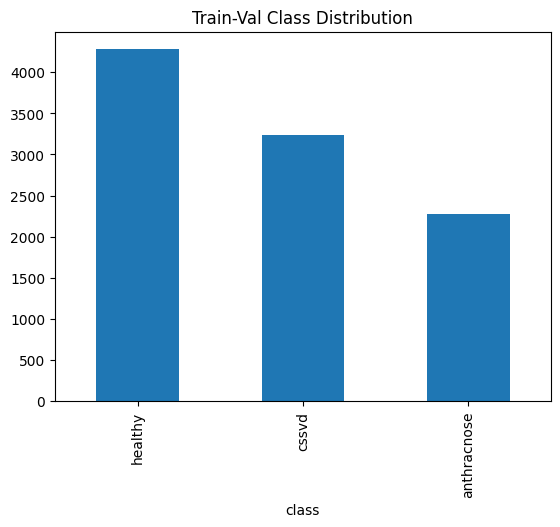

In [30]:
# Preview target distribution, seems there a class imbalance that needs to be handled
train['class'].value_counts().plot(kind='bar')
plt.title('Train-Val Class Distribution')
plt.show();

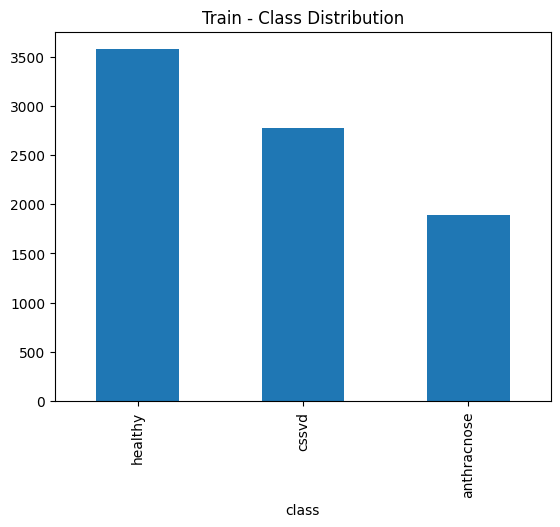

In [31]:
train_df['class'].value_counts().plot(kind='bar')
plt.title('Train - Class Distribution')
plt.show();

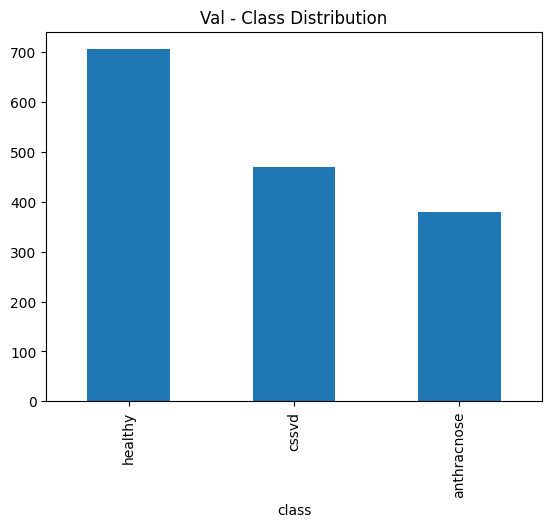

In [32]:
val_df['class'].value_counts().plot(kind='bar')
plt.title('Val - Class Distribution')
plt.show();

In [33]:
# Create a data.yaml file required by yolo
class_names = sorted(train['class'].unique().tolist())
num_classes = len(class_names)

data_yaml = {
    "path" : str(DATASETS_DIR.absolute()),
    'train': str(TRAIN_IMAGES_DIR.absolute()),
    'val': str(VAL_IMAGES_DIR.absolute()),
    'test': str(TEST_IMAGES_DIR.absolute()),
    'nc': num_classes,
    'names': class_names
}

yaml_path = 'data.yaml'
with open(yaml_path, 'w') as file:
    yaml.dump(data_yaml, file, default_flow_style=False)

# Preview data yaml file
data_yaml

{'path': '/Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset',
 'train': '/Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train',
 'val': '/Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val',
 'test': '/Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/test',
 'nc': 3,
 'names': ['anthracnose', 'cssvd', 'healthy']}

In [34]:
len(val_names), len(set(val_names))

(830, 830)

In [35]:
val_image_names = [str(Path(name).stem) for name in val_df['Image_ID'].unique()]

In [36]:
len(val_image_names)

830

In [37]:
# list of images in TRAIN_IMAGES_DIR
images_in_train_dir = os.listdir(TRAIN_IMAGES_DIR)
len(images_in_train_dir), len(train_names)

(5529, 4699)

In [38]:
train_image_names = [str(Path(name).stem) for name in train['ImagePath'].unique()]

In [39]:
len(train_image_names)

5529

In [40]:
# Check that VAL_IMAGES_DIR & VAL_LABELS_DIR exist if not create them
for DIR in [VAL_IMAGES_DIR, VAL_LABELS_DIR]:
  if not DIR.exists():
    DIR.mkdir(parents=True, exist_ok = True)

In [41]:
!jupyter nbextension enable --py widgetsnbextension

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: console dejavu events execute kernel kernelspec lab
labextension labhub migrate nbconvert notebook run server troubleshoot trust

Jupyter command `jupyter-nbextension` not found.


In [42]:
# Copy images in val_names to dataset/val and do the same with the labels
for image_name in tqdm(val_names):
    shutil.move(TRAIN_IMAGES_DIR / image_name, VAL_IMAGES_DIR / image_name)
    img_ext = image_name.split('.')[-1]
    label_name = image_name.replace(f'.{img_ext}', '.txt')
    shutil.move(TRAIN_LABELS_DIR / label_name, VAL_LABELS_DIR / label_name)

  0%|          | 0/830 [00:00<?, ?it/s]

Plotting ID_Z9NILu.jpg with 1 bounding boxes.


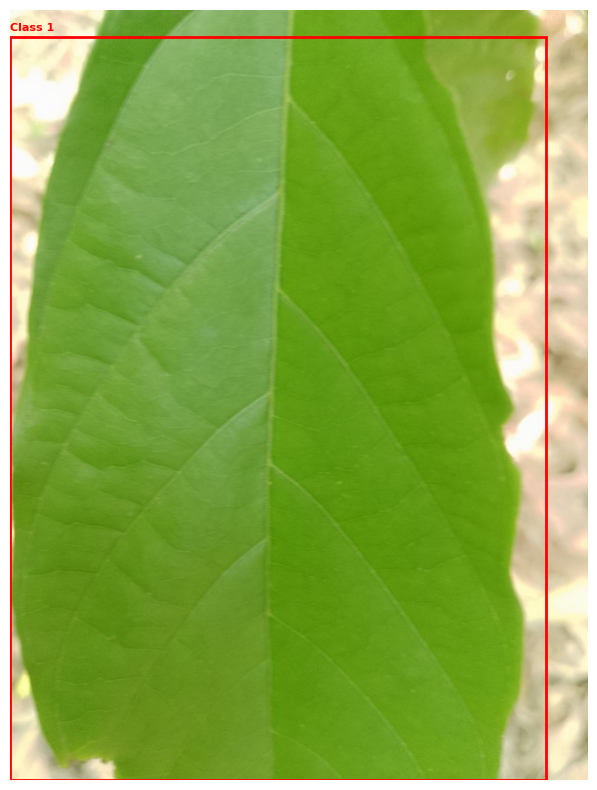

Plotting ID_GEJslb.jpeg with 1 bounding boxes.


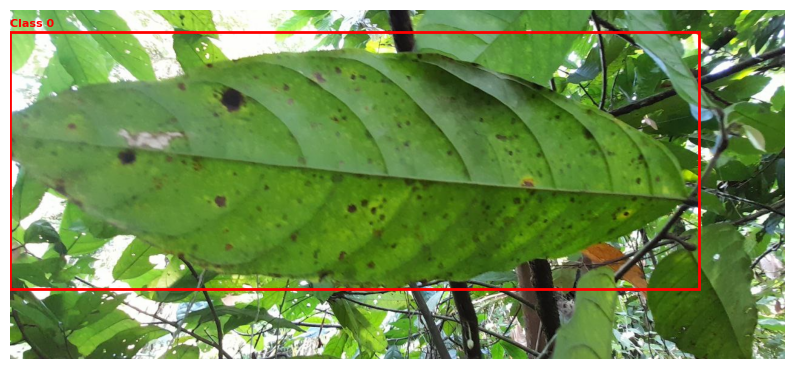

Plotting ID_l11WEm.jpg with 2 bounding boxes.


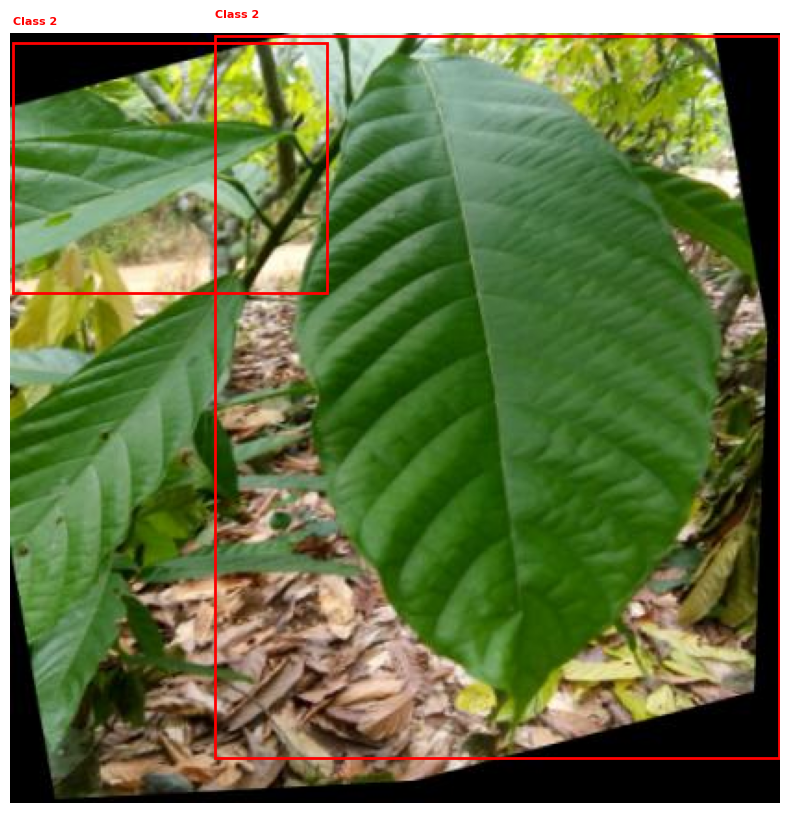

Plotting ID_BFveJq.jpeg with 1 bounding boxes.


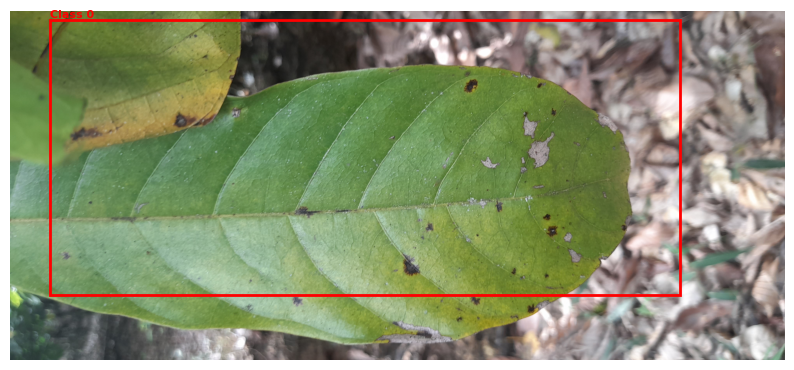

Plotting ID_Jkmaz4.jpg with 2 bounding boxes.


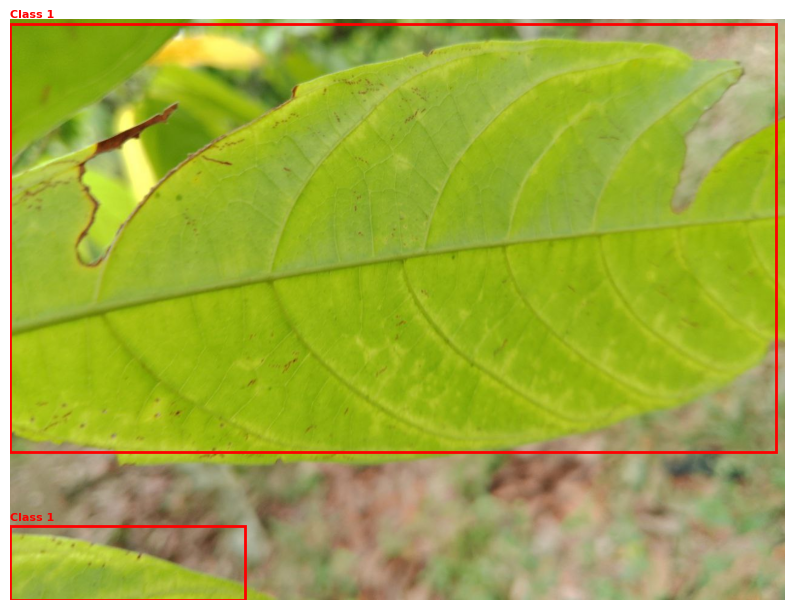

In [43]:
# Plot some images and their bboxes to ensure the conversion was done correctly
def load_annotations(label_path):
    with open(label_path, 'r') as f:
        lines = f.readlines()
    boxes = []
    for line in lines:
        class_id, x_center, y_center, width, height = map(float, line.strip().split())
        boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to plot an image with its bounding boxes
def plot_image_with_boxes(image_path, boxes):
    # Load the image
    image = np.array(Image.open(str(image_path)))


    # Get image dimensions
    h, w, _ = image.shape

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot each bounding box
    for box in boxes:
        class_id, x_center, y_center, width, height = box
        # Convert YOLO format to corner coordinates
        xmin = int((x_center - width / 2) * w)
        ymin = int((y_center - height / 2) * h)
        xmax = int((x_center + width / 2) * w)
        ymax = int((y_center + height / 2) * h)

        # Draw the bounding box
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                          edgecolor='red', facecolor='none', linewidth=2))
        plt.text(xmin, ymin - 10, f'Class {int(class_id)}', color='red', fontsize=8, weight='bold')

    plt.axis('off')
    plt.show()

# Directories for images and labels
IMAGE_DIR = TRAIN_IMAGES_DIR
LABEL_DIR = TRAIN_LABELS_DIR

# Plot a few images with their annotations
for image_name in os.listdir(IMAGE_DIR)[:5]:
    image_path = IMAGE_DIR / image_name
    img_ext = image_name.split('.')[-1]
    label_path = LABEL_DIR / (image_name.replace(f'.{img_ext}', '.txt'))

    if label_path.exists():
        boxes = load_annotations(label_path)
        print(f"Plotting {image_name} with {len(boxes)} bounding boxes.")
        plot_image_with_boxes(image_path, boxes)
    else:
        print(f"No annotations found for {image_name}.")


In [44]:
import torch
if torch.backends.mps.is_available():
    mps_device = torch.device("mps")
    x = torch.ones(1, device=mps_device)
    print (x)
else:
    print ("MPS device not found.")


tensor([1.], device='mps:0')


In [47]:
# Load a yolo pretrained model
from torch import device


model = YOLO('yolov8n.pt')

# Fine tune model to our data
model.train(
    data='data.yaml',          # Path to the dataset configuration
    epochs=2,                 # Number of epochs
    imgsz=640,                # Image size (height, width)
    batch=8,                   # Batch size
    # device='cpu',                 # Device to use (0 for the first GPU)
    device="mps",                 # Device to use (0 for the first GPU)
    patience=5)

New https://pypi.org/project/ultralytics/8.3.116 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.115 🚀 Python-3.13.3 torch-2.7.0 MPS (Apple M3)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=2, time=None, patience=5, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, s

train: Scanning /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/labels/train.cache... 4699 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4699/4699 [00:00<?, ?it/s]

train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AJD939.jpg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AMshRT.jpeg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AOGygM.jpeg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AbHMqL.jpg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AhmyiY.jpeg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AhwlUp.jpeg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/train/ID_AueB13.jpg: corrupt JPEG restored and saved
train: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/


/opt/miniconda3/envs/amini/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/labels/val.cache... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:00<?, ?it/s]

val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_Hmxdwo.jpg: corru


/opt/miniconda3/envs/amini/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train3
Starting training for 2 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/2      6.73G      1.343        2.2      1.651         15        640: 100%|██████████| 588/588 [1:40:49<00:00, 10.29s/it]    
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/52 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/52 [00:21<18:14, 21.47s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 2/52 [00:28<10:48, 12.98s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 3/52 [00:35<08:27, 10.35s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 4/52 [00:40<06:37,  8.29s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 5/52 [00:48<06:18,  8.06s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 6/52 [00:54<05:38,  7.37s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 7/52 [01:03<05:50,  7.78s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 8/52 [01:22<08:29, 11.59s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  17%|█▋        | 9/52 [01:30<07:20, 10.23s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 10/52 [01:36<06:23,  9.14s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 11/52 [01:43<05:46,  8.46s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 12/52 [01:49<05:03,  7.60s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 13/52 [01:55<04:36,  7.09s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 14/52 [02:09<05:55,  9.36s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 15/52 [02:16<05:10,  8.39s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 16/52 [02:21<04:25,  7.38s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 17/52 [02:26<03:53,  6.68s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 18/52 [02:31<03:36,  6.38s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  37%|███▋      | 19/52 [02:37<03:26,  6.27s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 20/52 [02:43<03:18,  6.20s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 21/52 [02:49<03:08,  6.09s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 22/52 [02:55<02:59,  5.99s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 23/52 [03:00<02:48,  5.80s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 24/52 [03:07<02:47,  5.97s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 25/52 [03:12<02:37,  5.85s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 26/52 [03:17<02:24,  5.55s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 27/52 [03:22<02:15,  5.42s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 28/52 [03:27<02:06,  5.26s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 29/52 [03:33<02:06,  5.48s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 30/52 [03:39<02:00,  5.49s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 31/52 [03:45<01:58,  5.62s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 32/52 [03:53<02:12,  6.61s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 33/52 [03:58<01:51,  5.87s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 34/52 [04:04<01:47,  5.96s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 35/52 [04:09<01:39,  5.87s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 36/52 [04:14<01:29,  5.62s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  71%|███████   | 37/52 [04:20<01:23,  5.58s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 38/52 [04:25<01:15,  5.39s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 39/52 [04:30<01:09,  5.35s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 40/52 [04:35<01:02,  5.22s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  79%|███████▉  | 41/52 [04:41<00:58,  5.28s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 42/52 [04:46<00:54,  5.41s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  83%|████████▎ | 43/52 [04:52<00:48,  5.40s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 44/52 [04:57<00:43,  5.49s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  87%|████████▋ | 45/52 [05:03<00:39,  5.70s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 46/52 [05:10<00:35,  5.95s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 47/52 [05:16<00:29,  5.87s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 48/52 [05:21<00:22,  5.70s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 49/52 [05:26<00:16,  5.64s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 50/52 [05:33<00:11,  5.80s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  98%|█████████▊| 51/52 [05:51<00:09,  9.70s/it]

WARNING ⚠️ NMS time limit 2.700s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [06:10<00:00,  7.12s/it]


                   all        830       1556      0.381      0.135      0.111     0.0627

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/2      6.84G      1.283      1.721       1.57          8        640: 100%|██████████| 588/588 [20:51<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/52 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/52 [00:05<04:45,  5.60s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 2/52 [00:13<05:38,  6.76s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 3/52 [00:20<05:34,  6.83s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 4/52 [00:25<05:02,  6.31s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 5/52 [00:32<05:15,  6.70s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 6/52 [00:37<04:32,  5.93s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 7/52 [00:44<04:36,  6.14s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 8/52 [00:52<04:56,  6.75s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  17%|█▋        | 9/52 [00:56<04:24,  6.14s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 10/52 [01:00<03:50,  5.48s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 11/52 [01:06<03:46,  5.54s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 12/52 [01:13<03:53,  5.83s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 13/52 [01:17<03:31,  5.42s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 14/52 [01:25<03:54,  6.17s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 15/52 [01:31<03:49,  6.20s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 16/52 [01:39<03:55,  6.55s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 17/52 [01:50<04:45,  8.15s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 18/52 [01:59<04:38,  8.19s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  37%|███▋      | 19/52 [02:07<04:29,  8.17s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 20/52 [02:11<03:43,  6.99s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 21/52 [02:18<03:37,  7.02s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 22/52 [02:23<03:12,  6.42s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 23/52 [02:29<03:05,  6.39s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 24/52 [02:35<02:51,  6.11s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 25/52 [02:41<02:41,  5.99s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 26/52 [02:48<02:45,  6.38s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 27/52 [02:57<02:56,  7.05s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 28/52 [03:04<02:50,  7.10s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 29/52 [03:10<02:34,  6.70s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 30/52 [03:15<02:20,  6.37s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 31/52 [03:23<02:25,  6.91s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 32/52 [03:28<02:03,  6.16s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 33/52 [03:36<02:06,  6.66s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 34/52 [03:41<01:54,  6.36s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 35/52 [03:49<01:55,  6.80s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 36/52 [03:55<01:43,  6.50s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  71%|███████   | 37/52 [04:00<01:33,  6.24s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 38/52 [04:05<01:19,  5.71s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 39/52 [04:12<01:20,  6.20s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 40/52 [04:21<01:25,  7.09s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  79%|███████▉  | 41/52 [04:27<01:12,  6.57s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 42/52 [04:32<01:02,  6.30s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  83%|████████▎ | 43/52 [04:37<00:51,  5.72s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 44/52 [04:42<00:45,  5.69s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  87%|████████▋ | 45/52 [04:49<00:40,  5.86s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 46/52 [04:53<00:32,  5.44s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 47/52 [04:58<00:26,  5.27s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 48/52 [05:05<00:22,  5.72s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 49/52 [05:11<00:17,  5.83s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 50/52 [05:18<00:12,  6.27s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  98%|█████████▊| 51/52 [05:22<00:05,  5.56s/it]

WARNING ⚠️ NMS time limit 2.700s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [05:28<00:00,  6.31s/it]


                   all        830       1556      0.365      0.121      0.102     0.0649

2 epochs completed in 2.223 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.115 🚀 Python-3.13.3 torch-2.7.0 MPS (Apple M3)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/52 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/52 [00:15<13:09, 15.48s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   4%|▍         | 2/52 [00:30<12:37, 15.14s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▌         | 3/52 [00:43<11:26, 14.01s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 4/52 [00:49<08:56, 11.18s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 5/52 [00:58<08:05, 10.33s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  12%|█▏        | 6/52 [01:06<07:11,  9.38s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 7/52 [01:14<06:49,  9.09s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▌        | 8/52 [01:22<06:22,  8.68s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  17%|█▋        | 9/52 [01:28<05:37,  7.84s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 10/52 [01:36<05:36,  8.00s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 11/52 [01:43<05:09,  7.54s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 12/52 [01:50<04:58,  7.46s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  25%|██▌       | 13/52 [01:58<04:50,  7.46s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 14/52 [02:09<05:28,  8.64s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 15/52 [02:14<04:40,  7.59s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 16/52 [02:21<04:26,  7.40s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 17/52 [02:34<05:17,  9.08s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▍      | 18/52 [02:39<04:21,  7.68s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  37%|███▋      | 19/52 [02:43<03:40,  6.69s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  38%|███▊      | 20/52 [02:50<03:39,  6.86s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 21/52 [02:58<03:44,  7.26s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 22/52 [03:03<03:17,  6.57s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 23/52 [03:08<02:54,  6.00s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  46%|████▌     | 24/52 [03:15<02:58,  6.39s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 25/52 [03:22<02:55,  6.51s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 26/52 [03:30<02:56,  6.79s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 27/52 [03:34<02:33,  6.13s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  54%|█████▍    | 28/52 [03:42<02:40,  6.67s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 29/52 [03:48<02:25,  6.31s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 30/52 [03:55<02:28,  6.74s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 31/52 [04:02<02:20,  6.68s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 32/52 [04:06<01:56,  5.84s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 33/52 [04:14<02:04,  6.58s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▌   | 34/52 [04:19<01:50,  6.13s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 35/52 [04:27<01:52,  6.64s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 36/52 [04:33<01:41,  6.36s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  71%|███████   | 37/52 [04:37<01:27,  5.85s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 38/52 [04:44<01:27,  6.25s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  75%|███████▌  | 39/52 [04:57<01:46,  8.16s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 40/52 [05:07<01:45,  8.80s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  79%|███████▉  | 41/52 [05:15<01:33,  8.48s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 42/52 [05:22<01:19,  7.94s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  83%|████████▎ | 43/52 [05:25<00:59,  6.58s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  85%|████████▍ | 44/52 [05:32<00:52,  6.53s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  87%|████████▋ | 45/52 [05:40<00:50,  7.20s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  88%|████████▊ | 46/52 [05:46<00:40,  6.79s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 47/52 [05:50<00:29,  5.93s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  92%|█████████▏| 48/52 [05:56<00:24,  6.06s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▍| 49/52 [06:02<00:17,  6.00s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  96%|█████████▌| 50/52 [06:10<00:12,  6.48s/it]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  98%|█████████▊| 51/52 [06:23<00:08,  8.33s/it]

WARNING ⚠️ NMS time limit 2.700s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [06:37<00:00,  7.64s/it]


                   all        830       1556       0.43       0.16      0.141     0.0901
           anthracnose        252        385      0.396      0.135      0.119     0.0721
                 cssvd        306        465       0.53       0.16      0.147     0.0997
               healthy        272        706      0.364      0.186      0.156     0.0984
Speed: 3.0ms preprocess, 27.5ms inference, 0.0ms loss, 227.8ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x5ae8d9480>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [51]:
# Validate the model on the validation set
model = YOLO('./runs/detect/train2/weights/best.pt')
results = model.val()

Ultralytics 8.3.115 🚀 Python-3.13.3 torch-2.7.0 CPU (Apple M3)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.1±0.2 ms, read: 1479.0±831.6 MB/s, size: 2713.1 KB)


val: Scanning /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/labels/val.cache... 830 images, 0 backgrounds, 0 corrupt: 100%|██████████| 830/830 [00:00<?, ?it/s]

val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_AYKor4.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_DEVBif.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_Dcoa03.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_ESQAmP.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_FtYRqz.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_GWhiLp.jpeg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_H9qAYr.jpg: corrupt JPEG restored and saved
val: /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/val/ID_Hmxdwo.jpg: corru


/opt/miniconda3/envs/amini/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.
  warnings.warn(warn_msg)
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [03:18<00:00,  3.82s/it]


                   all        830       1556      0.521      0.407      0.411      0.188
           anthracnose        252        385      0.819      0.223      0.424      0.181
                 cssvd        306        465      0.337      0.598      0.458      0.218
               healthy        272        706      0.408      0.399      0.351      0.166
Speed: 1.3ms preprocess, 211.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val


In [57]:
# Load the trained YOLO model
model = YOLO('./runs/detect/train2/weights/best.pt')

# Path to the test images directory
test_dir_path = TEST_IMAGES_DIR

# Get a list of all image files in the test directory
image_files = os.listdir(test_dir_path)

# Initialize an empty list to store the results for all images
all_data = []

# Initialize an empty list to store the results for all images
all_data = []

# Iterate through each image in the directory
for image_file in tqdm(image_files):
    # Full path to the image
    img_path = os.path.join(test_dir_path, image_file)

    # Make predictions on the image
    results = model(img_path)

    # Extract bounding boxes, confidence scores, and class labels
    boxes = results[0].boxes.xyxy.tolist() if results[0].boxes else []  # Bounding boxes in xyxy format
    classes = results[0].boxes.cls.tolist() if results[0].boxes else []  # Class indices
    confidences = results[0].boxes.conf.tolist() if results[0].boxes else []  # Confidence scores
    names = results[0].names  # Class names dictionary

    if boxes:  # If detections are found
        for box, cls, conf in zip(boxes, classes, confidences):
            x1, y1, x2, y2 = box
            detected_class = names[int(cls)]  # Get the class name from the names dictionary

            # Add the result to the all_data list
            all_data.append({
                'Image_ID': str(image_file),
                'class': detected_class,
                'confidence': conf,
                'ymin': y1,
                'xmin': x1,
                'ymax': y2,
                'xmax': x2
            })
    else:  # If no objects are detected
        all_data.append({
            'Image_ID': str(image_file),
            'class': "None",
            'confidence': None,
            'ymin': None,
            'xmin': None,
            'ymax': None,
            'xmax': None
        })



  0%|          | 0/1626 [00:00<?, ?it/s]


image 1/1 /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/test/ID_a7m7Ky.jpg: 1024x768 (no detections), 94.1ms
Speed: 2.9ms preprocess, 94.1ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/test/ID_D99Mnd.jpg: 1024x768 2 healthys, 76.7ms
Speed: 2.5ms preprocess, 76.7ms inference, 0.5ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/test/ID_Z7ar8k.jpg: 1024x1024 1 healthy, 107.5ms
Speed: 2.5ms preprocess, 107.5ms inference, 0.7ms postprocess per image at shape (1, 3, 1024, 1024)

image 1/1 /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/images/test/ID_tIRab8.jpeg: 1024x768 1 healthy, 77.6ms
Speed: 3.5ms preprocess, 77.6ms inference, 0.6ms postprocess per image at shape (1, 3, 1024, 768)

image 1/1 /Users/adjei/Desktop/Amini Cocoa Contamination Challenge/dataset/

In [58]:
# Convert the list to a DataFrame for all images
sub = pd.DataFrame(all_data)

In [59]:
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_a7m7Ky.jpg,None,NaN,NaN,NaN,NaN,NaN
1,ID_D99Mnd.jpg,healthy,0.400913,352.864624,167.079834,1508.643799,1063.873779
2,ID_D99Mnd.jpg,healthy,0.320172,570.940308,175.862366,1458.027344,959.732483
3,ID_Z7ar8k.jpg,healthy,0.780625,58.757530,86.320587,236.968811,246.550293
4,ID_tIRab8.jpeg,healthy,0.369699,231.169022,672.208008,3275.853760,2435.584473


In [60]:
sub['class'].value_counts()

class
cssvd          1054
healthy         652
None            270
anthracnose     168
Name: count, dtype: int64

In [56]:
# Create submission file to be uploaded to Zindi for scoring
sub.to_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission-1epoch.csv"}', index = False)

In [71]:
train['Image_ID'].nunique(), test['Image_ID'].nunique()

(5529, 1626)

In [72]:
train_df['Image_ID'].nunique() + val_df['Image_ID'].nunique() + test['Image_ID'].nunique()

7155

In [73]:
sub = pd.read_csv(f'{INPUT_DATA_DIR / "BenchmarkSubmission.csv"}')
sub.head()

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
0,ID_n9p1ZH.jpeg,anthracnose,0.509511,0.000000,1003.207886,3007.730957,2860.460938
1,ID_n9p1ZH.jpeg,healthy,0.312592,1428.554443,2756.289795,2304.696777,4004.034912
2,ID_tDjhPh.jpg,cssvd,0.904617,21.308746,171.976547,1218.401367,960.000000
3,ID_O3r16M.jpg,healthy,0.695902,121.038582,17.408247,1884.322266,2126.318359
4,ID_O3r16M.jpg,healthy,0.665808,464.426697,865.973633,3017.496826,2535.067871


In [74]:
## Make a dataframe from all entries in sub with no detection
no_detection = sub[~sub['class'].isin(['cssvd', 'healthy', 'anthracnose'])]
no_detection

,Image_ID,class,confidence,ymin,xmin,ymax,xmax
37,ID_ItYYic.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
117,ID_QcU601.jpg,NaN,NaN,NaN,NaN,NaN,NaN
176,ID_FbsP3U.JPG,NaN,NaN,NaN,NaN,NaN,NaN
293,ID_R6trN8.jpeg,NaN,NaN,NaN,NaN,NaN,NaN
378,ID_TnGU2G.jpg,NaN,NaN,NaN,NaN,NaN,NaN
503,ID_xGu1Jv.JPG,NaN,NaN,NaN,NaN,NaN,NaN
575,ID_pnZVaB.jpg,NaN,NaN,NaN,NaN,NaN,NaN
590,ID_jHqWXa.jpg,NaN,NaN,NaN,NaN,NaN,NaN
615,ID_wLF5dT.jpg,NaN,NaN,NaN,NaN,NaN,NaN
709,ID_jLH9Ls.jpg,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
# Get a random image from no_detection
rnd_no_detect_image = no_detection.sample(1)['Image_ID'].values[0]
rnd_no_detect_image

'ID_V4uHkL.jpeg'

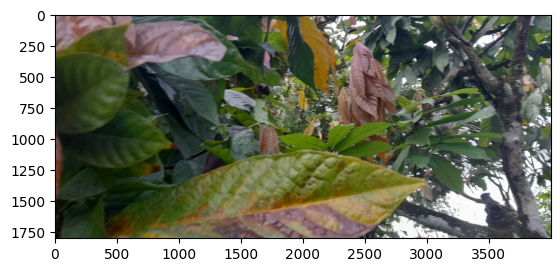

In [76]:
# Plot the rnd_no_detect_image
image_path = TEST_IMAGES_DIR / rnd_no_detect_image
image = np.array(Image.open(str(image_path)))
plt.imshow(image);

In [77]:
no_detection['Image_ID'].unique()

array(['ID_ItYYic.jpeg', 'ID_QcU601.jpg', 'ID_FbsP3U.JPG', 'ID_R6trN8.jpeg', 'ID_TnGU2G.jpg', 'ID_xGu1Jv.JPG', 'ID_pnZVaB.jpg', 'ID_jHqWXa.jpg', 'ID_wLF5dT.jpg', 'ID_jLH9Ls.jpg', 'ID_XzSqhK.JPG', 'ID_anegvH.jpeg', 'ID_Gc703Q.jpg', 'ID_OgEb5I.jpg', 'ID_GM6Ads.JPG', 'ID_hcfuoO.JPG', 'ID_mHoDGw.JPG', 'ID_GSj4su.jpeg',
       'ID_Zz62xP.jpg', 'ID_Suoisd.JPG', 'ID_CWDQS2.jpeg', 'ID_ksM9yC.JPG', 'ID_rcw57Y.JPG', 'ID_gxJl1S.jpg', 'ID_G0OzBp.jpg', 'ID_PH0j4i.jpg', 'ID_JfmHHi.jpeg', 'ID_XvjhVZ.JPG', 'ID_V6RfQo.jpg', 'ID_V4uHkL.jpeg', 'ID_toOsZ9.jpg', 'ID_sUfpAn.jpg', 'ID_K6TSq2.jpg', 'ID_HiEYk8.jpg', 'ID_Fb4rRp.jpg'], dtype=object)

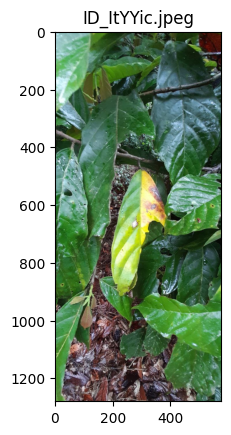

--------------------------------------



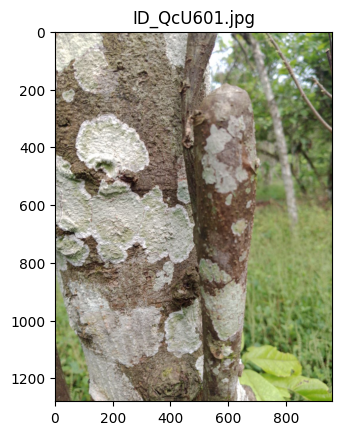

--------------------------------------



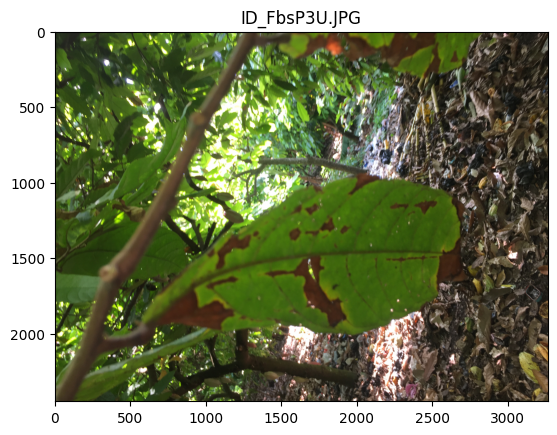

--------------------------------------



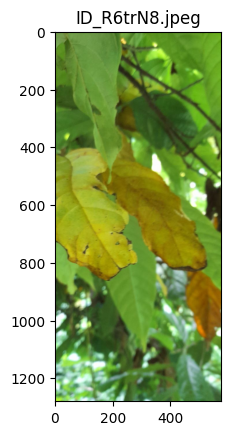

--------------------------------------



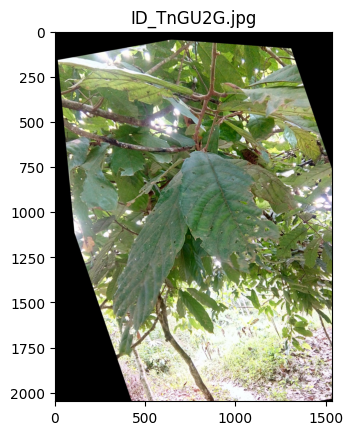

--------------------------------------



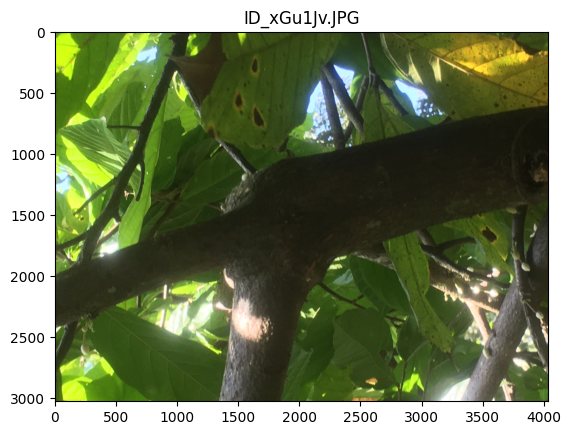

--------------------------------------



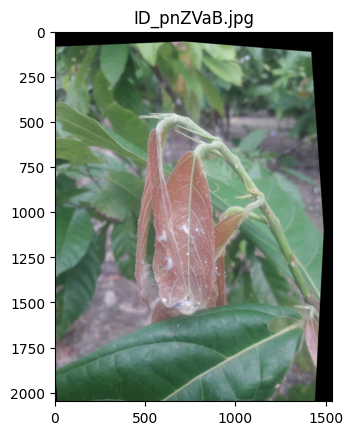

--------------------------------------



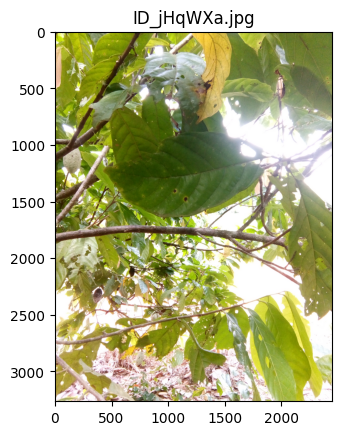

--------------------------------------



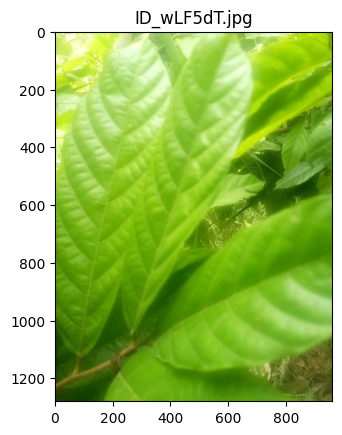

--------------------------------------



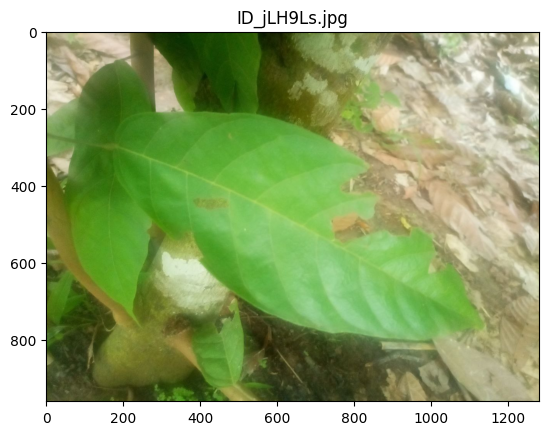

--------------------------------------



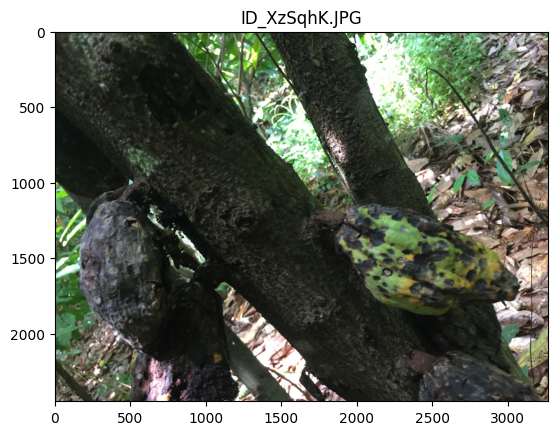

--------------------------------------



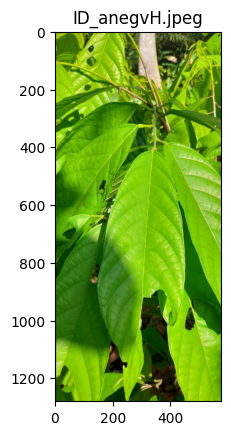

--------------------------------------



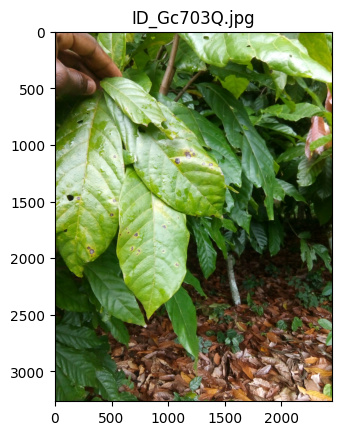

--------------------------------------



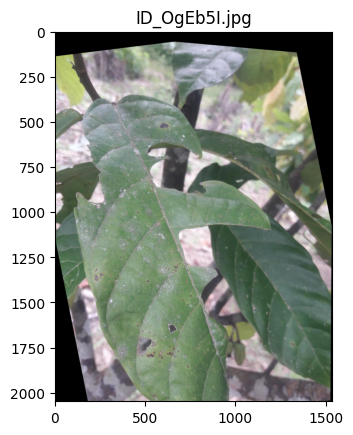

--------------------------------------



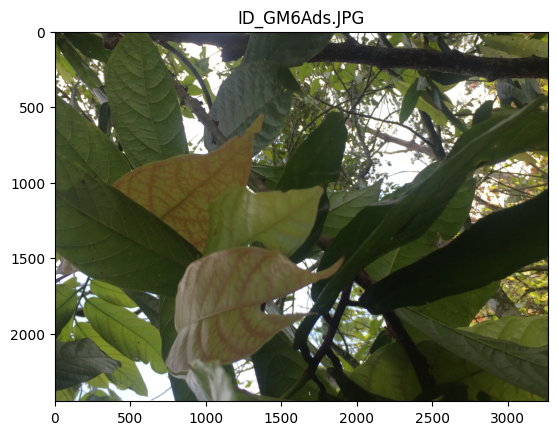

--------------------------------------



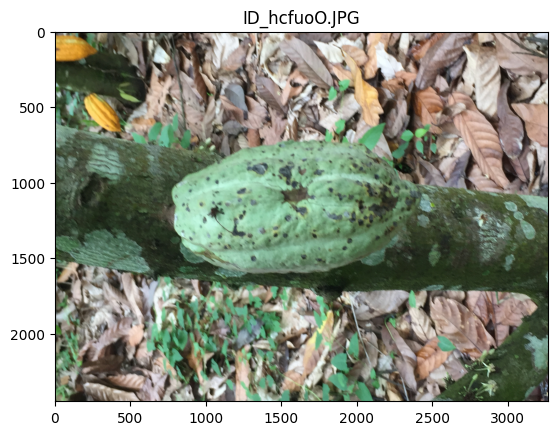

--------------------------------------



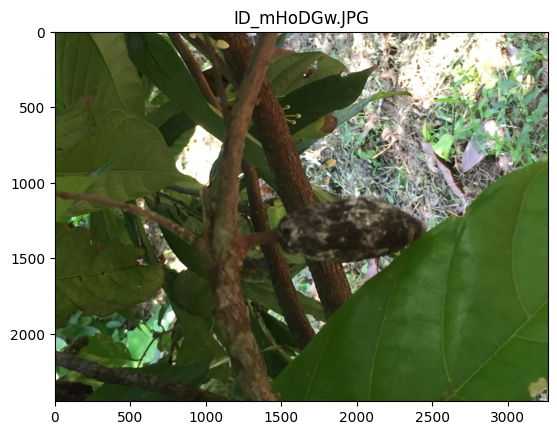

--------------------------------------



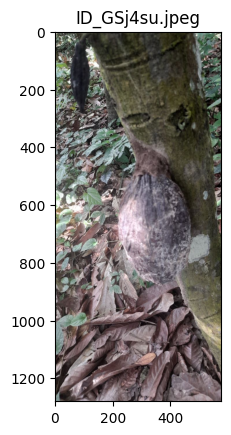

--------------------------------------



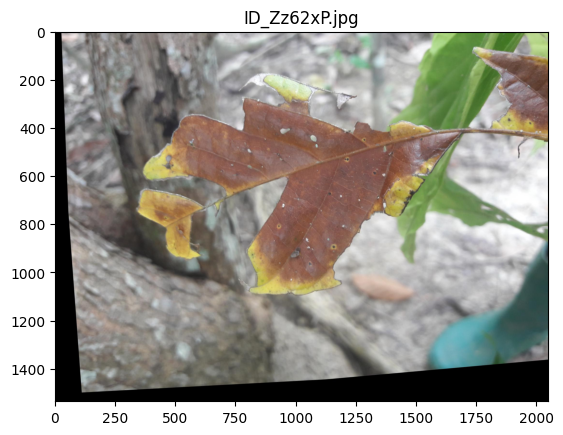

--------------------------------------



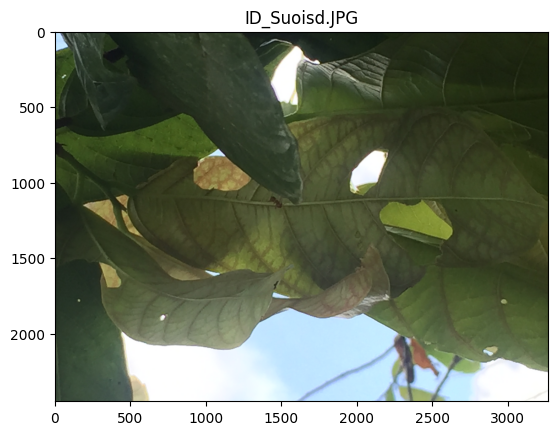

--------------------------------------



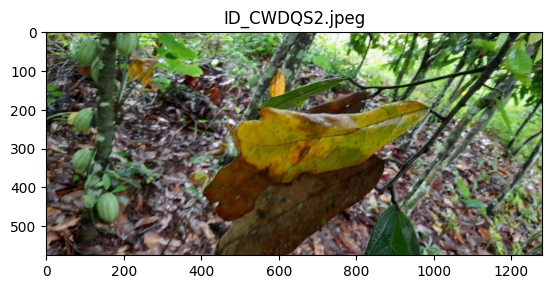

--------------------------------------



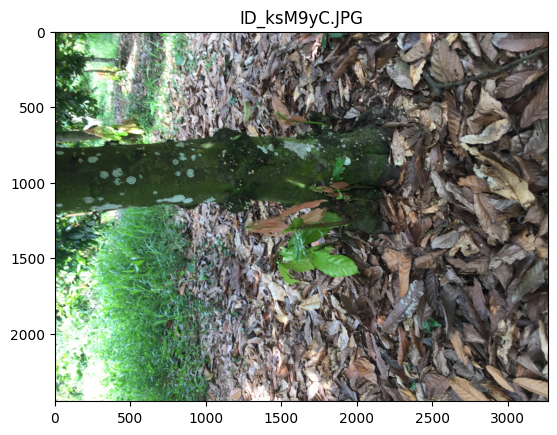

--------------------------------------



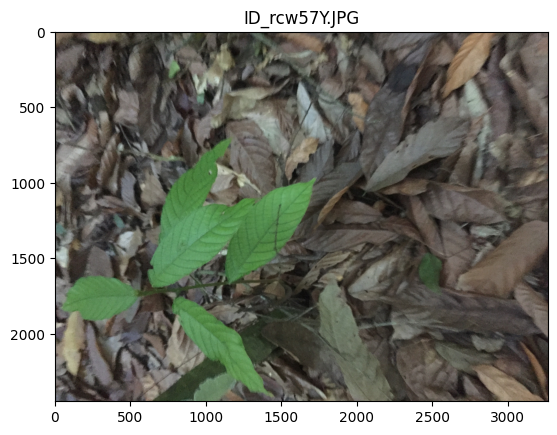

--------------------------------------



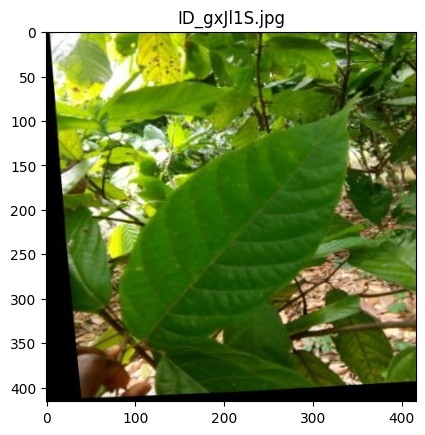

--------------------------------------



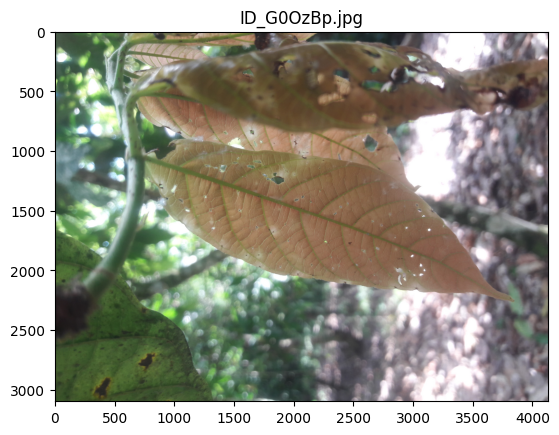

--------------------------------------



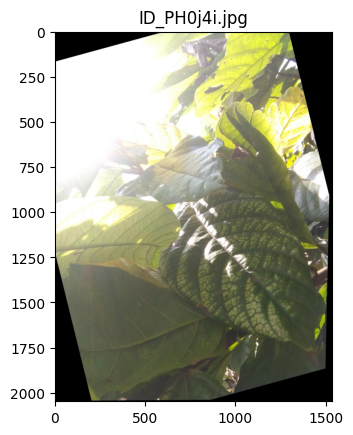

--------------------------------------



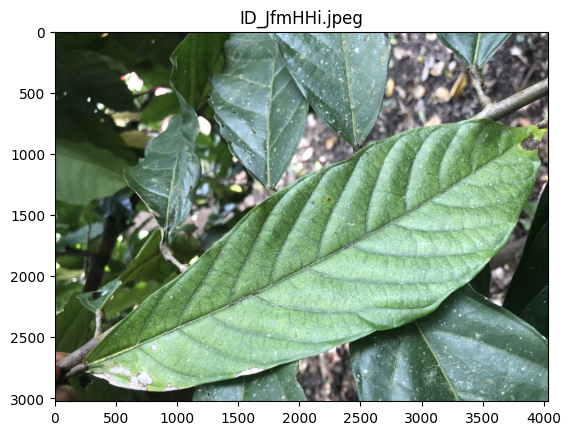

--------------------------------------



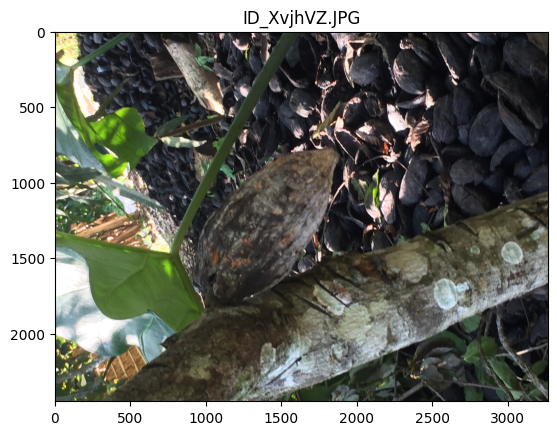

--------------------------------------



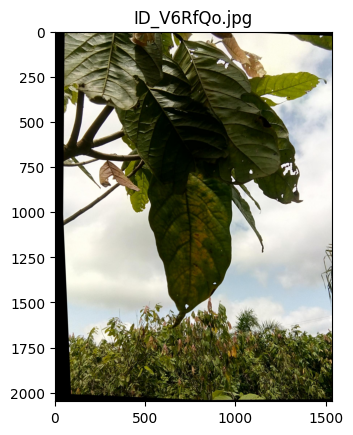

--------------------------------------



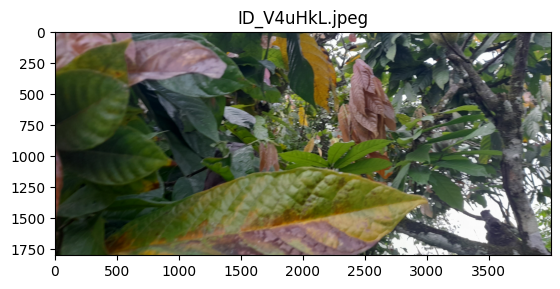

--------------------------------------



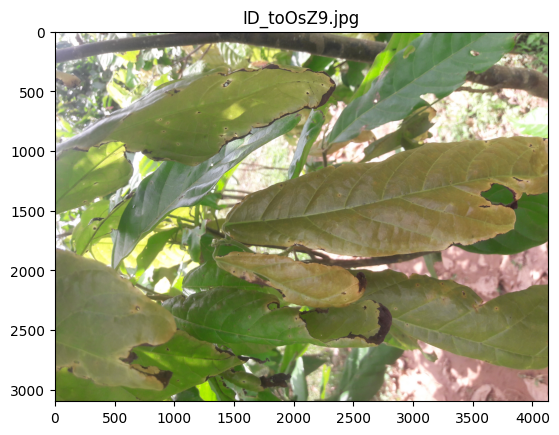

--------------------------------------



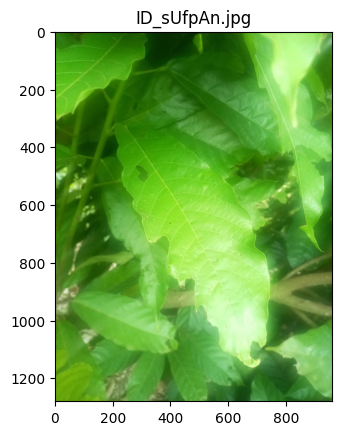

--------------------------------------



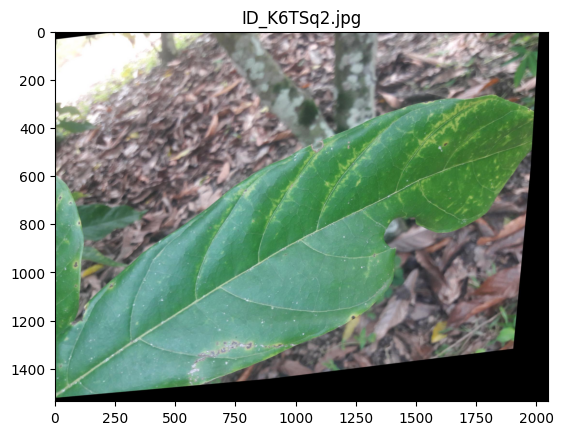

--------------------------------------



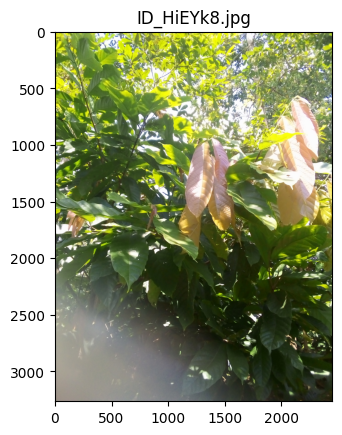

--------------------------------------



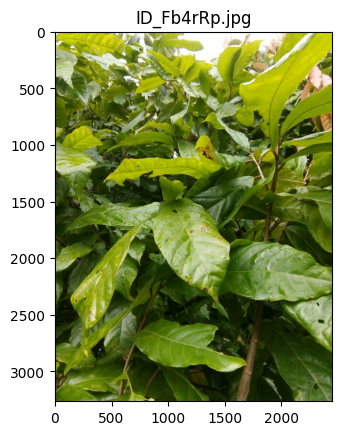

--------------------------------------



In [78]:
# Plot each of the image in no_detection dataframe
for image_name in no_detection['Image_ID'].unique():
    image_path = TEST_IMAGES_DIR / image_name
    plt.title(image_name)
    image = np.array(Image.open(str(image_path)))
    plt.imshow(image)
    plt.show()
    print('--------------------------------------\n')